# Load libraries and activations

Load the files that list the image stimuli for a particular subject and load the corresponding ResNet activations for those images. We will run t-SNE on the activations and determine data-driven categories by running k-means clustering on the low-dimensional embedding. Then, we will train a simple multilayer perceptron classifier. The optimal number of categories will be determined by setting k, the number of clusters, as an additional hyperparameter.

In [31]:
import numpy as np
import matplotlib.pyplot as plt
import os
from sklearn.manifold import TSNE
from keras.preprocessing import image
from keras.models import Model, Sequential
from keras.layers import Dense, Dropout
from collections import Counter
import pickle

with open('/home/ubuntu/cs230Project/imagenet2label.p', 'rb') as f:
    imagenet2label = pickle.load(f)

with open('/home/ubuntu/cs230Project/coco2label.p', 'rb') as f:
    coco2label = pickle.load(f)

stim_dir = 'stimuli/'
stimlist_dir = '../boldroi/ROIs/stim_lists/'
activations_dir = '../fmriNet2/imageActivation/'

subj_lists = sorted([os.path.join(stimlist_dir,f) for f in os.listdir(stimlist_dir) if os.path.isfile(os.path.join(stimlist_dir,f))])
subj_act = sorted([os.path.join(activations_dir,f) for f in os.listdir(activations_dir) if os.path.isfile(os.path.join(activations_dir,f))])

# Only for sub-CSI1
stimlistfile, actfile = subj_lists[0], subj_act[0] 
stimlist = np.loadtxt(stimlistfile, dtype = str)
activations = np.load(actfile, allow_pickle = True)
image2act = {}
image2subcat = {}
for img,act in zip(stimlist,activations):
    if img in image2act or 'rep' in img:
        continue
    else:
        image2act[img] = act
    if 'COCO' in img:
        image_id = img.split('_')[-1].split('.')[0].strip('0')
        try:
            image2subcat[img] = coco2label[image_id]
        except KeyError:
            continue
    elif 'JPEG' in img:
        image_id = img.split('_')[0]
        try:
            image2subcat[img] = imagenet2label[image_id]
        except KeyError:
            continue
    else:
        image2subcat[img] = 'scene'

# Create super categories
supcats = ['artifact','animal','scene','outdoor']
classes = ['artifact', 'animal', 'scene']
image2supcat = {img: image2subcat[img] for img in image2subcat if image2subcat[img] in supcats}
for img in image2supcat:
    if image2supcat[img] == 'outdoor':
        image2supcat[img] = 'scene'

catcount = Counter(image2subcat.values())
print('%d images' % len(image2subcat))
print('%d subcategories' % len(catcount.keys()))
for cat in catcount:
    print('\t%s: %d' % (cat, catcount[cat]))

catcount = Counter(image2supcat.values())
print('%d images' % len(image2supcat))
print('%d supercategories' % len(catcount.keys()))
for cat in catcount:
    print('\t%s: %d' % (cat, catcount[cat]))

with open('/home/ubuntu/cs230Project/image2subcat.p', 'wb') as f:
    pickle.dump(image2subcat,f)

with open('/home/ubuntu/cs230Project/image2supcat.p', 'wb') as f:
    pickle.dump(image2supcat,f)

4722 images
16 subcategories
	animal: 1181
	artifact: 1014
	food: 171
	furniture: 165
	scene: 1016
	indoor: 81
	vehicle: 259
	sports: 100
	person: 342
	outdoor: 59
	electronic: 75
	appliance: 42
	kitchen: 108
	plant: 30
	accessory: 67
	communication: 12
3270 images
3 supercategories
	animal: 1181
	artifact: 1014
	scene: 1075


# Visualize image clusters using tSNE

In [32]:
X = np.array([image2act[img] for img in sorted(image2act.keys())])
X_emb = TSNE(n_components = 2, verbose = 1).fit_transform(X)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 4912 samples in 0.447s...
[t-SNE] Computed neighbors for 4912 samples in 96.780s...
[t-SNE] Computed conditional probabilities for sample 1000 / 4912
[t-SNE] Computed conditional probabilities for sample 2000 / 4912
[t-SNE] Computed conditional probabilities for sample 3000 / 4912
[t-SNE] Computed conditional probabilities for sample 4000 / 4912
[t-SNE] Computed conditional probabilities for sample 4912 / 4912
[t-SNE] Mean sigma: 10.027869
[t-SNE] KL divergence after 250 iterations with early exaggeration: 85.689194
[t-SNE] KL divergence after 1000 iterations: 1.822795


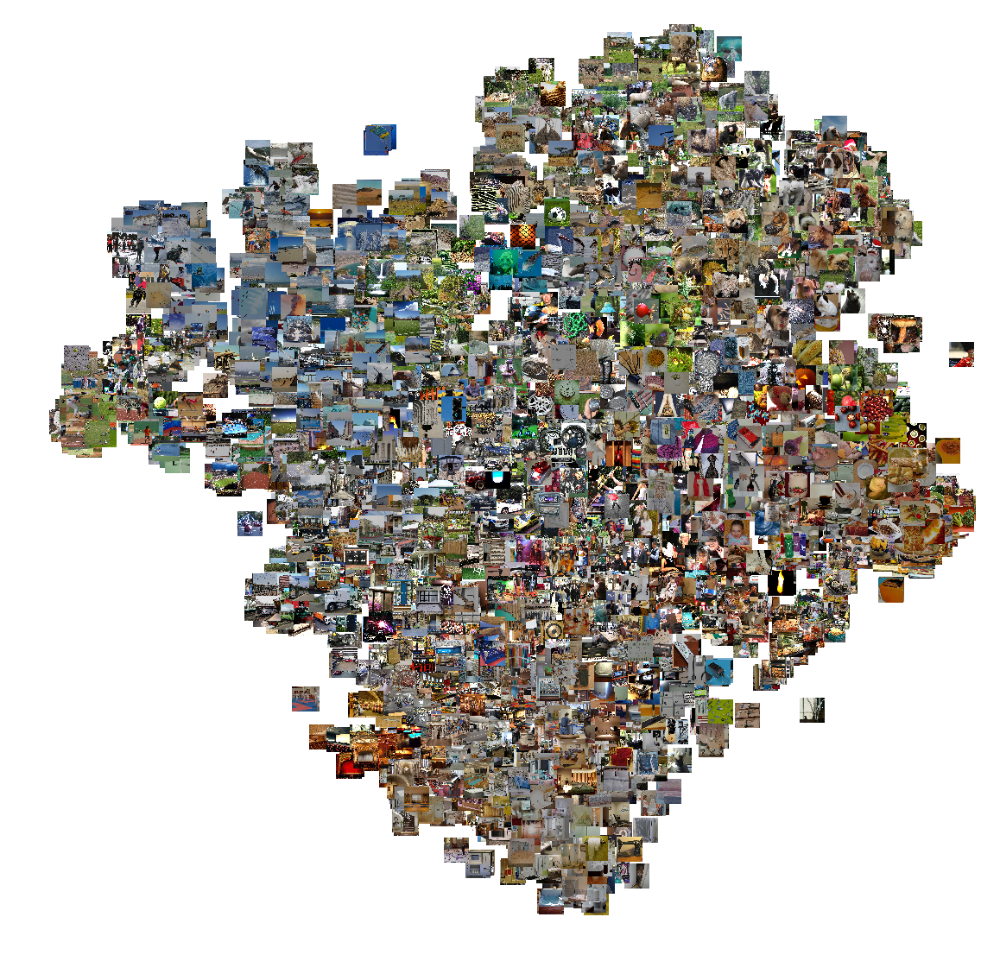

In [16]:
# Size of one side of image, in terms of the embedding dimension
s = 2
# Map from image file to embedding coordinates
image2emb = {x: X_emb[ind] for ind, x in enumerate(sorted(image2act.keys()))}

plt.close('all')
fig, ax = plt.subplots(1,1,figsize=(20,20))
ax.set_xlim([np.min(X_emb[:,0]) - 5,np.max(X_emb[:,0]) + 5])
ax.set_ylim([np.min(X_emb[:,1]) - 5,np.max(X_emb[:,1]) + 5])

# Plot each image
for x in image2emb:
    filepath = os.path.join(stim_dir,x)
    img = image.load_img(filepath, target_size=(224, 224))
    img = image.img_to_array(img).astype(np.uint8)
    left, right, bottom, top = image2emb[x][0] - s, image2emb[x][0] + s, image2emb[x][1] - s, image2emb[x][1] + s

    ax.imshow(img, extent = [left,right,bottom,top])

plt.axis('off')
plt.savefig('stimuli_resnet_tsne.png', dpi = 300)
plt.show()

## Color by subcategory

In [40]:
X = np.array([image2act[img] for img in sorted(image2subcat.keys())])
X_emb = TSNE(n_components = 2, verbose = 1).fit_transform(X)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 4722 samples in 0.370s...
[t-SNE] Computed neighbors for 4722 samples in 87.054s...
[t-SNE] Computed conditional probabilities for sample 1000 / 4722
[t-SNE] Computed conditional probabilities for sample 2000 / 4722
[t-SNE] Computed conditional probabilities for sample 3000 / 4722
[t-SNE] Computed conditional probabilities for sample 4000 / 4722
[t-SNE] Computed conditional probabilities for sample 4722 / 4722
[t-SNE] Mean sigma: 10.186190
[t-SNE] KL divergence after 250 iterations with early exaggeration: 85.314812
[t-SNE] KL divergence after 1000 iterations: 1.822834


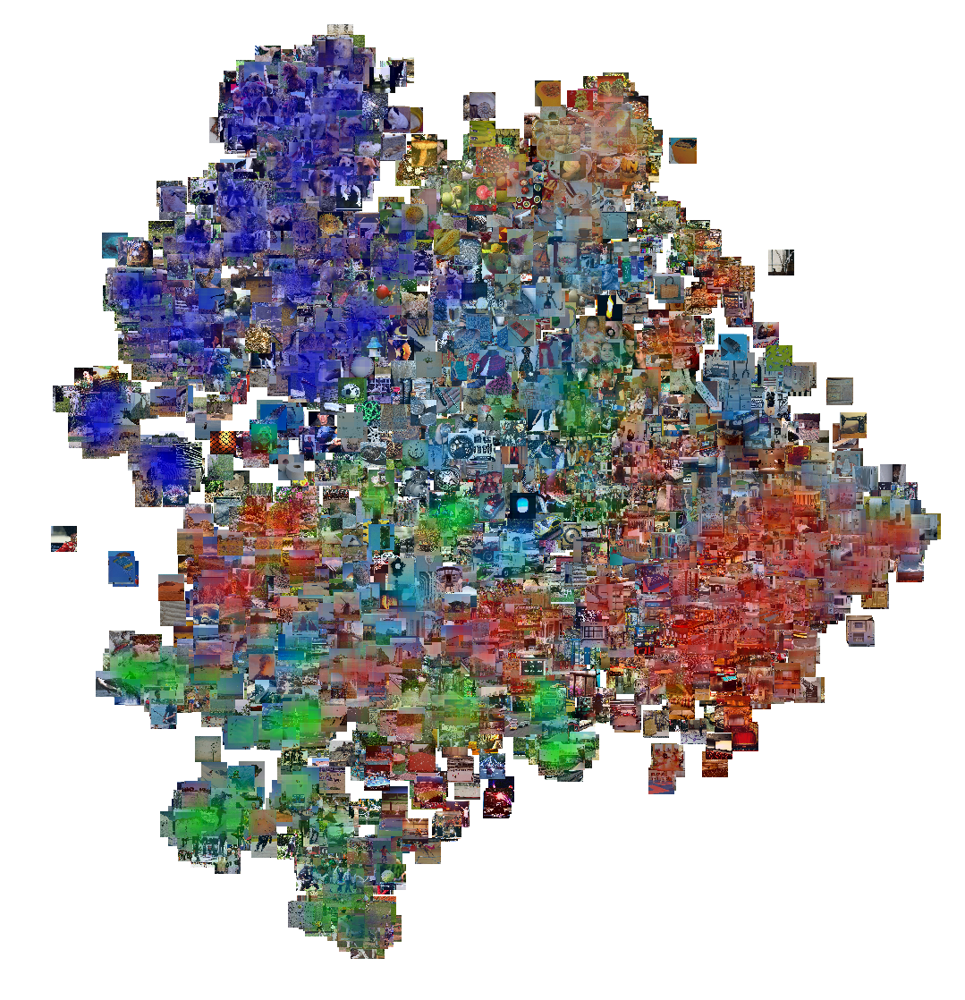

In [49]:
from matplotlib.patches import Rectangle

subcats = set(image2subcat.values())
colors = plt.cm.nipy_spectral(np.linspace(0,1,len(subcats)))
np.random.shuffle(colors)

subcat2ind = {cat: ind for ind,cat in enumerate(subcats)}

# Size of one side of image, in terms of the embedding dimension
s = 2
# Map from image file to embedding coordinates
image2emb = {x: X_emb[ind] for ind, x in enumerate(sorted(image2subcat.keys()))}

plt.close('all')
fig, ax = plt.subplots(1,1,figsize=(20,20))
ax.set_xlim([np.min(X_emb[:,0]) - 5,np.max(X_emb[:,0]) + 5])
ax.set_ylim([np.min(X_emb[:,1]) - 5,np.max(X_emb[:,1]) + 5])

# Plot each image
for ind,x in enumerate(sorted(image2emb.keys())):
    filepath = os.path.join(stim_dir,x)
    img = image.load_img(filepath, target_size=(224, 224))
    img = image.img_to_array(img).astype(np.uint8)
    left, right, bottom, top = image2emb[x][0] - s, image2emb[x][0] + s, image2emb[x][1] - s, image2emb[x][1] + s
    xrect,yrect,wrect,hrect = image2emb[x][0] - s, image2emb[x][1] - s, 2*s, 2*s
    patch = Rectangle((xrect,yrect), wrect, hrect, linewidth=1, edgecolor='none', facecolor=colors[subcat2ind[image2subcat[x]]], alpha = 0.05)
    
    ax.imshow(img, extent = [left,right,bottom,top])
    ax.add_patch(patch)
    

plt.axis('off')
plt.savefig('stimuli_subcategories.png', dpi = 300)
plt.show()

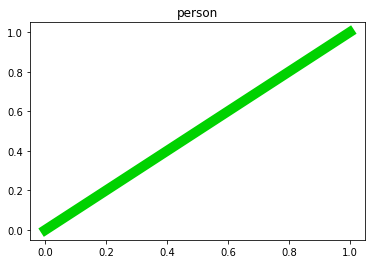

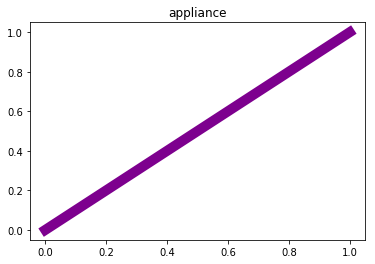

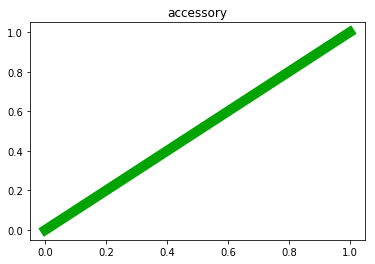

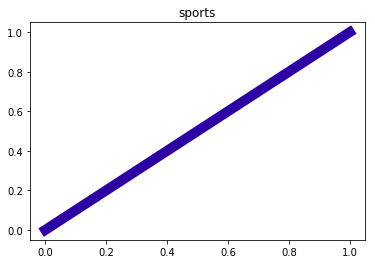

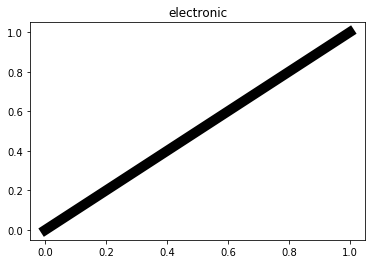

...

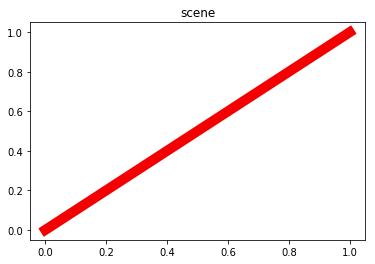

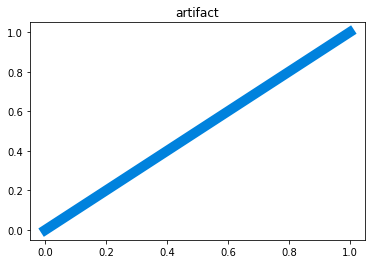

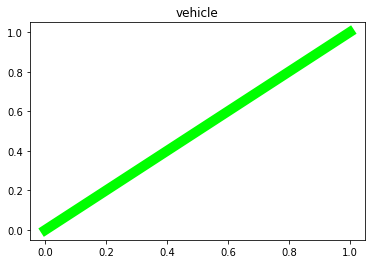

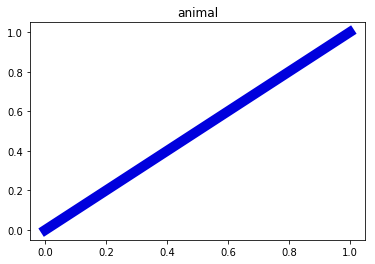

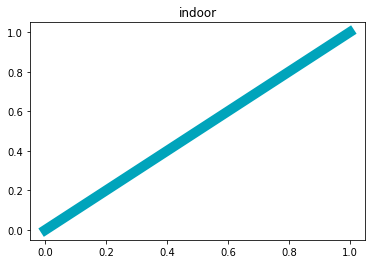

In [50]:
ind2subcat = {ind: cat for cat,ind in subcat2ind.items()}

for ind,color in enumerate(colors):
    plt.close('all')
    plt.plot([0,1],[0,1], color=color, linewidth=10)
    plt.title(ind2subcat[ind])
    plt.show()

## Color by supercategory

In [36]:
X = np.array([image2act[img] for img in sorted(image2supcat.keys())])
X_emb = TSNE(n_components = 2, verbose = 1).fit_transform(X)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 3270 samples in 0.228s...
[t-SNE] Computed neighbors for 3270 samples in 38.557s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3270
[t-SNE] Computed conditional probabilities for sample 2000 / 3270
[t-SNE] Computed conditional probabilities for sample 3000 / 3270
[t-SNE] Computed conditional probabilities for sample 3270 / 3270
[t-SNE] Mean sigma: 10.236833
[t-SNE] KL divergence after 250 iterations with early exaggeration: 83.006187
[t-SNE] KL divergence after 1000 iterations: 1.790948


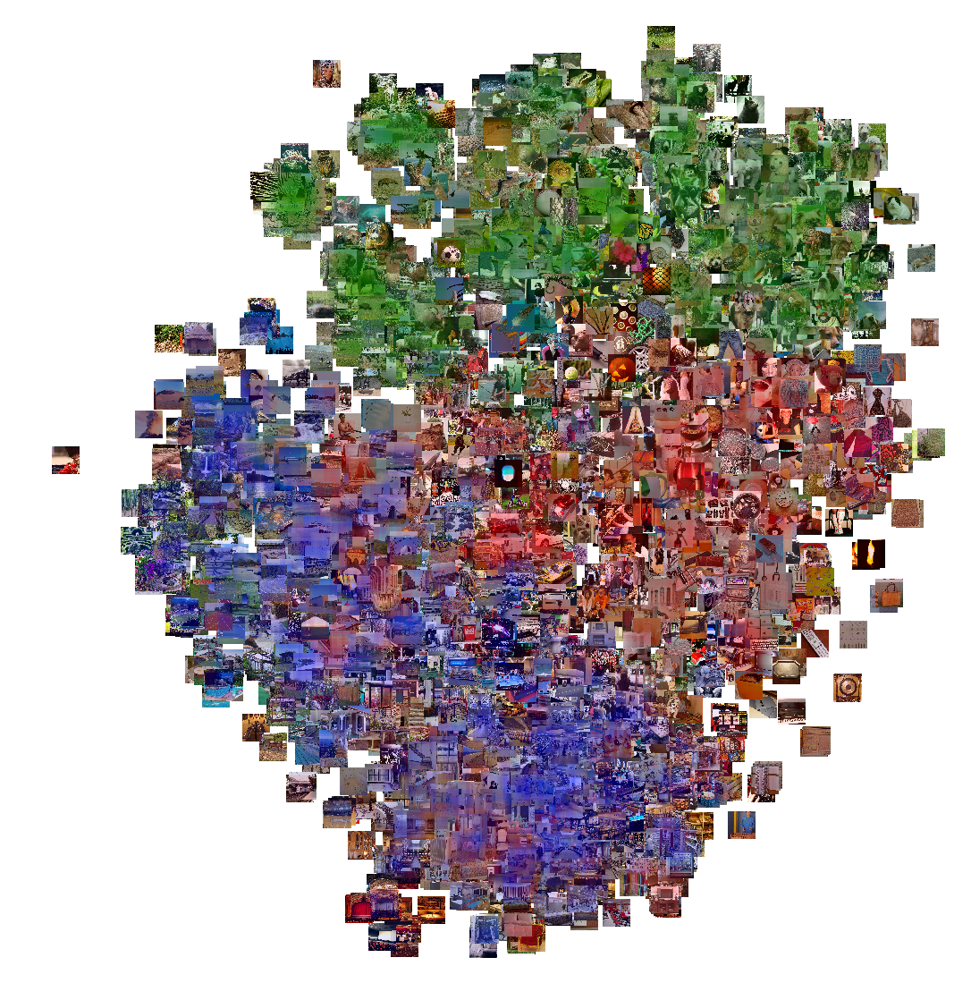

In [39]:
from matplotlib.patches import Rectangle

supcats = set(image2supcat.values())
colors = ['red','green','blue']

supcat2ind = {cat: ind for ind,cat in enumerate(supcats)}

# Size of one side of image, in terms of the embedding dimension
s = 2
# Map from image file to embedding coordinates
image2emb = {x: X_emb[ind] for ind, x in enumerate(sorted(image2supcat.keys()))}

plt.close('all')
fig, ax = plt.subplots(1,1,figsize=(20,20))
ax.set_xlim([np.min(X_emb[:,0]) - 5,np.max(X_emb[:,0]) + 5])
ax.set_ylim([np.min(X_emb[:,1]) - 5,np.max(X_emb[:,1]) + 5])

# Plot each image
for ind,x in enumerate(sorted(image2emb.keys())):
    filepath = os.path.join(stim_dir,x)
    img = image.load_img(filepath, target_size=(224, 224))
    img = image.img_to_array(img).astype(np.uint8)
    left, right, bottom, top = image2emb[x][0] - s, image2emb[x][0] + s, image2emb[x][1] - s, image2emb[x][1] + s
    xrect,yrect,wrect,hrect = image2emb[x][0] - s, image2emb[x][1] - s, 2*s, 2*s
    patch = Rectangle((xrect,yrect), wrect, hrect, linewidth=1, edgecolor='none', facecolor=colors[supcat2ind[image2supcat[x]]], alpha = 0.05)
    
    ax.imshow(img, extent = [left,right,bottom,top])
    ax.add_patch(patch)
    

plt.axis('off')
plt.savefig('stimuli_supercategories.png', dpi = 300)
plt.show()

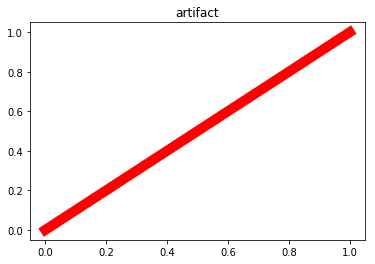

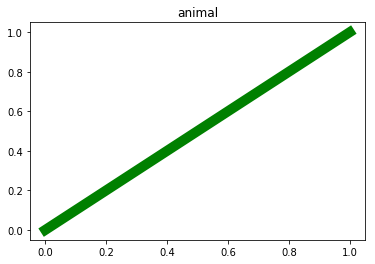

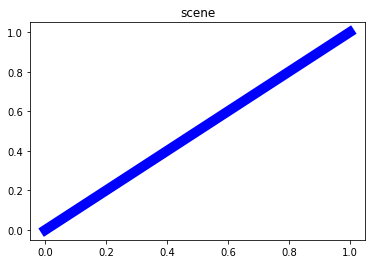

In [48]:
colors = ['red','green','blue']
ind2supcat = {ind: cat for cat,ind in supcat2ind.items()}

for ind,color in enumerate(colors):
    plt.close('all')
    plt.plot([0,1],[0,1], color=color, linewidth=10)
    plt.title(ind2supcat[ind])
    plt.show()

## K-means clustering on the embedding

In [13]:
from sklearn.cluster import KMeans

K = np.arange(2,31,1)
error = []

for k in K:
    print('k = %d' % k)
    inertia = []
    # Run a few times since initial conditions are random
    for i in range(10):
        kmeans = KMeans(n_clusters = k).fit(X_emb)
        inertia.append(kmeans.inertia_)
    error.append(np.mean(kmeans.inertia_))

k = 2
k = 3
k = 4
k = 5
k = 6
k = 7
k = 8
k = 9
k = 10
k = 11
k = 12
k = 13
k = 14
k = 15
k = 16
k = 17
k = 18
k = 19
k = 20
k = 21
k = 22
k = 23
k = 24
k = 25
k = 26
k = 27
k = 28
k = 29
k = 30


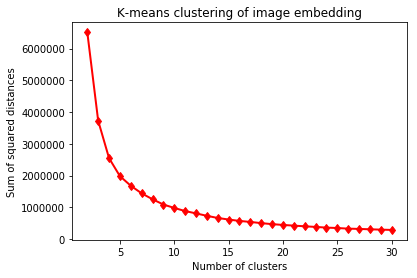

In [14]:
fig,ax = plt.subplots(1,1,figsize=(6,4))
ax.plot(K,error,color='r',linewidth=2,marker='d')
ax.set_xlabel('Number of clusters')
ax.set_ylabel('Sum of squared distances')
ax.set_title('K-means clustering of image embedding')
plt.show()

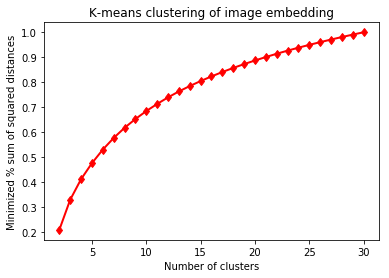

In [15]:
errsum = np.cumsum(error) / np.sum(error)
fig,ax = plt.subplots(1,1,figsize=(6,4))
ax.plot(K,errsum,color='r',linewidth=2,marker='d')
ax.set_xlabel('Number of clusters')
ax.set_ylabel('Minimized % sum of squared distances')
ax.set_title('K-means clustering of image embedding')
plt.show()

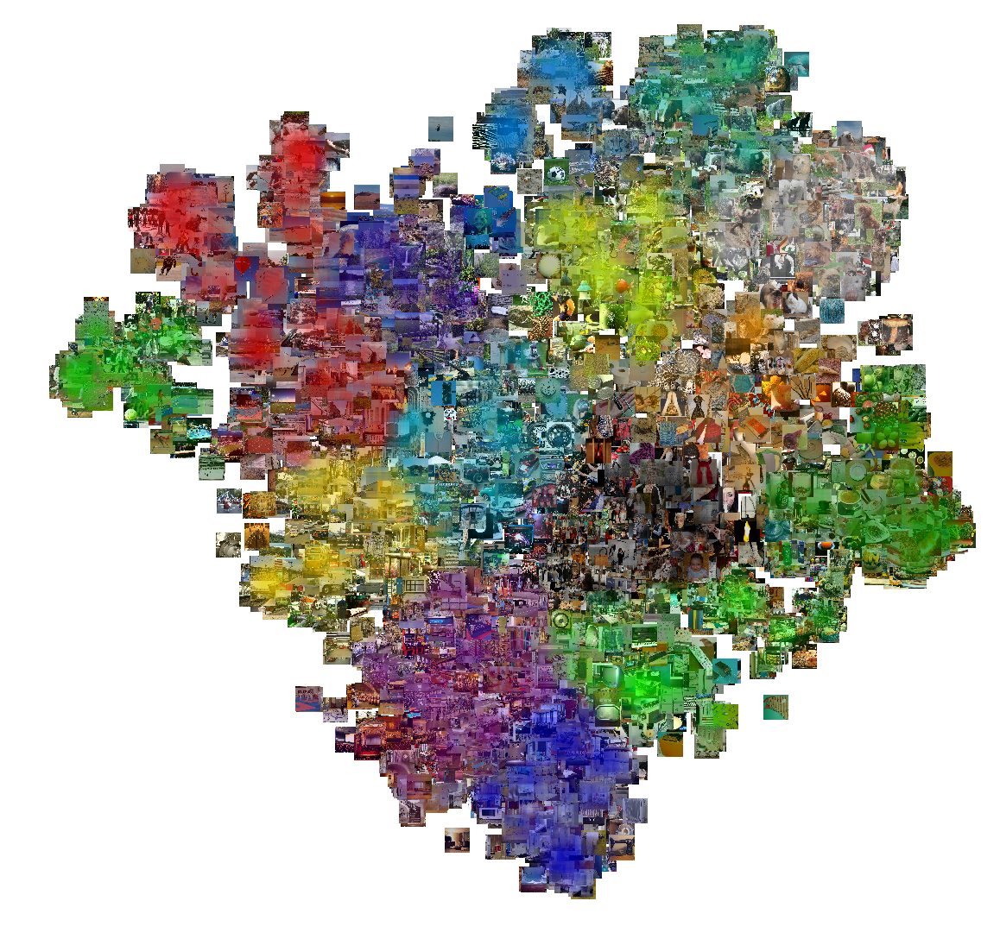

In [13]:
from matplotlib.patches import Rectangle
from sklearn.cluster import KMeans

bestK = 16
colors = plt.cm.nipy_spectral(np.linspace(0,1,bestK))
kmeans = KMeans(n_clusters = bestK).fit(X_emb)

plt.close('all')
fig, ax = plt.subplots(1,1,figsize=(20,20))
ax.set_xlim([np.min(X_emb[:,0]) - 5,np.max(X_emb[:,0]) + 5])
ax.set_ylim([np.min(X_emb[:,1]) - 5,np.max(X_emb[:,1]) + 5])

# Plot each image
for ind,x in enumerate(sorted(image2emb.keys())):
    filepath = os.path.join(image_dir,x)
    img = image.load_img(filepath, target_size=(224, 224))
    img = image.img_to_array(img).astype(np.uint8)
    left, right, bottom, top = image2emb[x][0] - s, image2emb[x][0] + s, image2emb[x][1] - s, image2emb[x][1] + s
    xrect,yrect,wrect,hrect = image2emb[x][0] - s, image2emb[x][1] - s, 2*s, 2*s
    patch = Rectangle((xrect,yrect), wrect, hrect, linewidth=1, edgecolor='none', facecolor=colors[kmeans.labels_[ind]], alpha = 0.05)
    
    ax.imshow(img, extent = [left,right,bottom,top])
    ax.add_patch(patch)
    

plt.axis('off')
plt.savefig('stimuli_kmeans.png', dpi = 300)
plt.show()

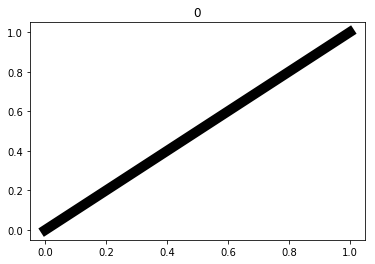

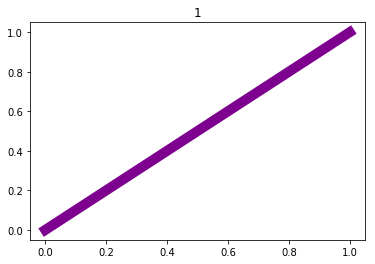

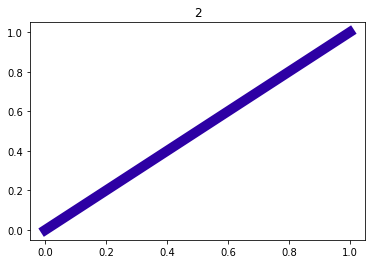

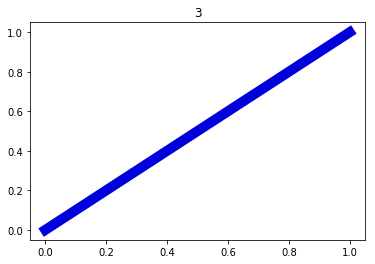

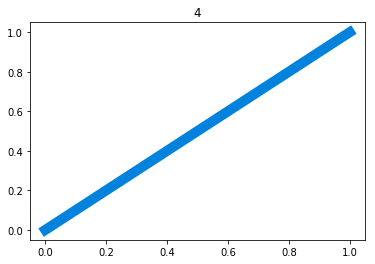

...

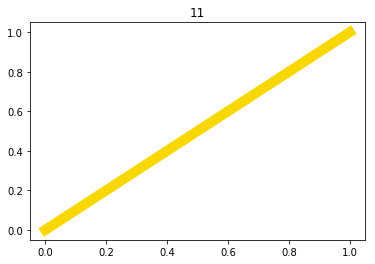

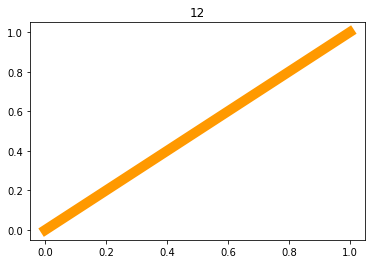

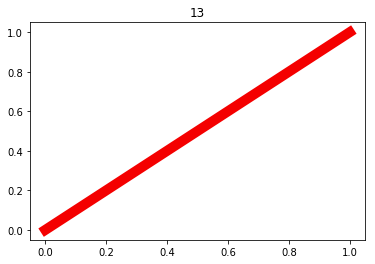

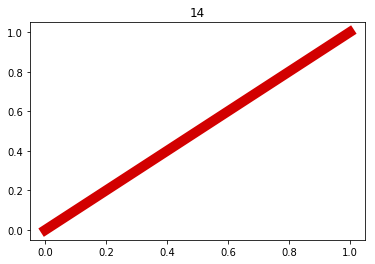

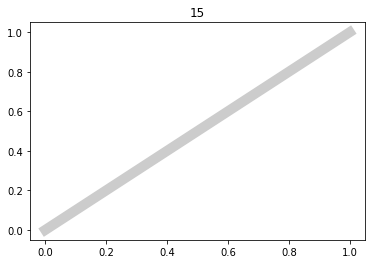

In [16]:
for cluster_num,color in enumerate(colors):
    plt.close('all')
    plt.plot([0,1],[0,1], color=color, linewidth=10)
    plt.title(cluster_num)
    plt.show()

### Export K-means clusters as semantic categorical labels

In [17]:
cluster2label = {0: 'people',
                 1: 'indoor_spaces',
                 2: 'landscape',
                 3: 'household',
                 4: 'patterned',
                 5: 'circular',
                 6: 'large_mammals',
                 7: 'food',
                 8: 'sports',
                 9: 'technology',
                 10: 'wildlife',
                 11: 'cityscape',
                 12: 'textured',
                 13: 'sea_and_snow',
                 14: 'infrastructure',
                 15: 'small_mammals'}

In [23]:
import pandas as pd

semantic_labels = [cluster2label[cluster_num] for cluster_num in kmeans.labels_]
table = np.array([sorted(image2emb.keys()), kmeans.labels_, semantic_labels]).T
df = pd.DataFrame(data = table, columns = ['ImgName', 'ClusterNum', 'Category'])
df.to_csv('image_labels.tsv', sep='\t', header=False, index=False)

# Visualize ROI data using tSNE

#### Load data

In [51]:
X_all = np.load('X_all.npy')
onehot_all = np.load('Y_all.npy')
Y_all = np.argmax(onehot_all, axis=1)
with open('classes.p', 'rb') as f:
    classes = pickle.load(f)
ind2class = {ind: cat for cat,ind in classes.items()}

#### Run t-SNE

In [52]:
X = np.array([x[2] for x in X_all])
X_emb = TSNE(n_components = 2, verbose = 1).fit_transform(X)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 13136 samples in 3.282s...
[t-SNE] Computed neighbors for 13136 samples in 2027.925s...
[t-SNE] Computed conditional probabilities for sample 1000 / 13136
[t-SNE] Computed conditional probabilities for sample 2000 / 13136
[t-SNE] Computed conditional probabilities for sample 3000 / 13136
[t-SNE] Computed conditional probabilities for sample 4000 / 13136
[t-SNE] Computed conditional probabilities for sample 5000 / 13136
[t-SNE] Computed conditional probabilities for sample 6000 / 13136
[t-SNE] Computed conditional probabilities for sample 7000 / 13136
[t-SNE] Computed conditional probabilities for sample 8000 / 13136
[t-SNE] Computed conditional probabilities for sample 9000 / 13136
[t-SNE] Computed conditional probabilities for sample 10000 / 13136
[t-SNE] Computed conditional probabilities for sample 11000 / 13136
[t-SNE] Computed conditional probabilities for sample 12000 / 13136
[t-SNE] Computed conditional probabilities for 

In [53]:
np.save('fmri_tsne.npy', X_emb)

#### Plot embedding

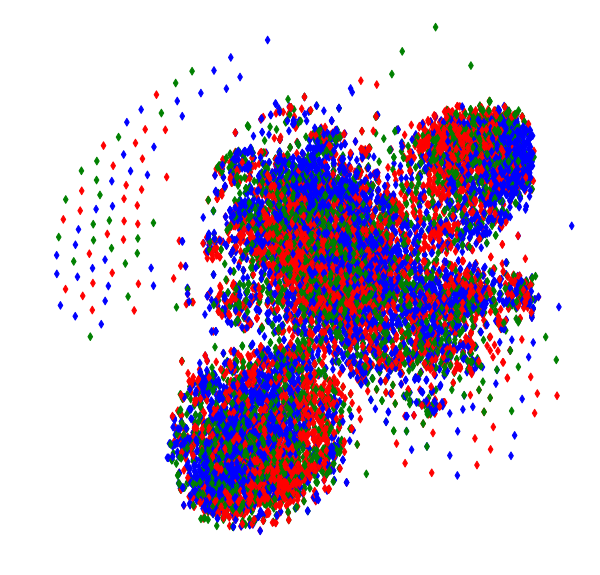

In [54]:
colors = ['red','green','blue']
c = [colors[y] for y in Y_all]

plt.close('all')
fig, ax = plt.subplots(1,1,figsize=(10,10))
ax.set_xlim([np.min(X_emb[:,0]) - 5,np.max(X_emb[:,0]) + 5])
ax.set_ylim([np.min(X_emb[:,1]) - 5,np.max(X_emb[:,1]) + 5])
ax.scatter(X_emb[:,0], X_emb[:,1], c = c, s = 30, marker = 'd')
    
plt.axis('off')
plt.savefig('fmri_supercategories.png', dpi = 300)
plt.show()